In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

plt.style.use(['science','ieee'])

import pickle
from rich.progress import track
import os
from itertools import combinations

In [2]:
with open('readings_timeid.pkl','rb') as f:
    results = pickle.load(f)

In [3]:
total_id_list = [  3,   5,   7,   8,   9,  10,  11,  12,  13,  14,  15,  17,  18,
        19,  21,  23,  24,  25,  26,  27,  30,  31,  32,  33,  34,  35,
        36,  37,  39,  40,  41,  42,  43,  44,  45,  46,  47,  49,  50,
        51,  53,  54,  55,  56,  57,  59,  60,  61,  62,  63,  64,  65,
        66,  68,  69,  70,  71,  72,  73,  75,  76,  79,  80,  81,  82,
        84,  85,  87,  88,  89,  92,  93,  94,  95,  96,  97,  98,  99,
       100, 103, 104, 105, 106, 107, 109, 111, 121, 122]

In [4]:
ori_path = '/home/esmidth/github/DCS/Sensorscope/luce_stations/'
sub_prefix = 'sensorscope-meteo-'
sub_suffix = '.txt'
file_list = os.listdir(ori_path)
name = [
'Station ID',
'Year',
'Month',
'Day',
'Hour',
'Minute',
'Second',
'Time since the epoch [s]',
'Sequence Number',
'Ambient Temperature',
'Surface Temperature',
'Solar Radiation',
'Relative Humidity [%]',
'Soil Moisture [%]',
'Watermark [kPa]',
'Rain Meter [mm]',
'Wind Speed [m/s]',
'Wind Direction [°]',
]

In [5]:
# 4
lat = (46.51788,46.52227)
log = (6.56517,6.5693)

loc_file = '/home/esmidth/github/DCS/Sensorscope/EPFL_sensor_loc_simple2.xlsx'
df = pd.read_excel(loc_file)

lat_range = np.linspace(lat[0],lat[1],11)
log_range = np.linspace(log[0],log[1],11)
# print(lat_range)
# print(log_range)

In [6]:
def draw_lune_heatmap(df,res,lat=lat,log=log):
    lat_range = np.linspace(lat[1],lat[0],res+1)
    log_range = np.linspace(log[0],log[1],res+1)
    pic = np.zeros((res,res))
    pic2 = np.zeros((res,res))
    pairs = []
    for i in range(res):
        # print(i,lat_range[i],lat_range[i+1])
        for j in range(res):
            sub_df = df[(df['Latitude'] < lat_range[i]) & (df['Latitude'] > lat_range[i+1]) & (df['Longitude'] > log_range[j]) & (df['Longitude'] < log_range[j+1])]
            pic[i][j] = len(sub_df)
            if len(sub_df) > 0:
                pic2[i][j]=1
            # pic[i][j] = i*res+j
            if len(sub_df) > 1:
                pairs.append([i*res+j,sub_df['ID'].values])
            max_value = 0
            max_id = 0
            for value in sub_df['ID'].values:
                # print(value)
                if len(sub_df[sub_df['ID'] == value]) > max_value:
                    max_id =value
            pic[i][j] = max_id
    return pic,pairs,pic2
# 输出的pic有颜色明暗，pic2为黑白两色

[[14, array([ 3, 23, 42])], [15, array([ 5, 17])], [24, array([21, 26, 41])], [25, array([14, 30, 39, 56])], [26, array([  9,  15,  18,  24,  37,  44, 105, 121])], [27, array([12, 45, 46])], [28, array([ 8, 25, 36])], [33, array([64, 75, 99])], [36, array([13, 40])], [37, array([ 34,  43, 106])], [53, array([ 70, 122])], [54, array([49, 68])], [63, array([66, 72])], [64, array([54, 73])], [66, array([ 32,  35,  50,  94, 107])], [69, array([79, 95])], [75, array([92, 97])], [77, array([33, 53])], [78, array([10, 19])], [91, array([85, 89])]]
[[  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.]
 [ 63.   0.   0.   0.  42.  17.   0.   0.   0.   0.]
 [ 47.   7.  27.   0.  41.  56. 121.  46.  36.   0.]
 [  0.   0. 111.  99.  57.  59.  40. 106.   0.   0.]
 [  0.  61.  71.  65.   0.  82.  62.   0.  76.   0.]
 [  0.  51.  11. 122.  68.   0.   0.  60.   0.   0.]
 [ 84.  81.  55.  72.  73.   0. 107.  31.  69.  95.]
 [103.  80.  96.   0.   0.  97. 100.  53.  19.  93.]
 [109.  87.   0.   0. 104.   

/tmp/ipykernel_97626/2673327657.py:4: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  plt.grid(b=False)


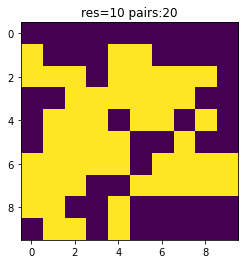

In [7]:
res = 10
pic,pairs,pic2 = draw_lune_heatmap(df,res,lat,log)
plt.title('res='+str(res)+' pairs:'+str(len(pairs)))
plt.grid(b=False)
plt.imshow(pic2)
print(pairs)
print(pic)

In [8]:
pairs

[[14, array([ 3, 23, 42])],
 [15, array([ 5, 17])],
 [24, array([21, 26, 41])],
 [25, array([14, 30, 39, 56])],
 [26, array([  9,  15,  18,  24,  37,  44, 105, 121])],
 [27, array([12, 45, 46])],
 [28, array([ 8, 25, 36])],
 [33, array([64, 75, 99])],
 [36, array([13, 40])],
 [37, array([ 34,  43, 106])],
 [53, array([ 70, 122])],
 [54, array([49, 68])],
 [63, array([66, 72])],
 [64, array([54, 73])],
 [66, array([ 32,  35,  50,  94, 107])],
 [69, array([79, 95])],
 [75, array([92, 97])],
 [77, array([33, 53])],
 [78, array([10, 19])],
 [91, array([85, 89])]]

In [9]:
results_ones = np.zeros_like(results)
results_ones[np.where(results > 0)] = 1


In [10]:
comb = []
res1 = []
res2 = []
res3 = []
res4 = []



for pair in pairs:
    print('----')
    for c in combinations(pair[1],2):
        comb.append(c)
        tmp_sum = np.ones_like(results.T[0])
        v1 = tmp_sum * results_ones.T[c[0]]
        # plt.plot(tmp_sum,label='2')
        # plt.figure(figsize=(5,5))
        # plt.imshow(tmp_sum.reshape(745,686),label='ori')
        v2 = tmp_sum * results_ones.T[c[1]]
        # plt.figure(figsize=(5,5))
        # plt.imshow(tmp_sum.reshape(745,686),label='2')
        # plt.plot(tmp_sum,label='3')

        #有值的点与总数的比率
        # ratio = len(np.where(tmp_sum == 1)[0]) / len(tmp_sum)
        r1 = len(np.where(v1 == 1)[0])/len(tmp_sum)
        r2 = len(np.where(v2 == 1)[0])/len(tmp_sum)

        #聚合后与总数的比率
        v3 = v1+v2
        r3 = len(np.where(v3 >= 1)[0])/ len(tmp_sum)

        #两个传感器的子集的点，越低越聚合
        v3 = v1*v2
        r4 = len(np.where(v3 == 1)[0])/len(tmp_sum)

        res1.append(r1)
        res2.append(r2)
        res3.append(r3)
        res4.append(r4)

        #算出来是互斥率
        print(c,r1,r2,r3,r4)
        

----
(3, 23) 0.705826990431839 0.8297258692547009 0.8602813704580586 0.6752714892284815
(3, 42) 0.705826990431839 0.7848181266754065 0.838141546167844 0.6525035709394017
(23, 42) 0.8297258692547009 0.7848181266754065 0.8632613927642006 0.7512826031659068
----
(5, 17) 0.7462011074803843 0.8128808186745455 0.852548574559258 0.7065333515956719
----
(21, 26) 0.7279296378186941 0.8245798031580801 0.8503238303950535 0.7021856105817207
(21, 41) 0.7279296378186941 0.8264543017590545 0.8680943902009509 0.6862895493767976
(26, 41) 0.8245798031580801 0.8264543017590545 0.8682665779638797 0.7827675269532549
----
(14, 30) 0.8087052654235232 0.7493552742285793 0.8738822470503063 0.6841782926017962
(14, 39) 0.8087052654235232 0.7870741777055981 0.8953607137965445 0.7004187293325768
(14, 56) 0.8087052654235232 0.5787700315025339 0.8555657737687596 0.5319095231572974
(30, 39) 0.7493552742285793 0.7870741777055981 0.8740485647758625 0.6623808871583149
(30, 56) 0.7493552742285793 0.5787700315025339 0.789

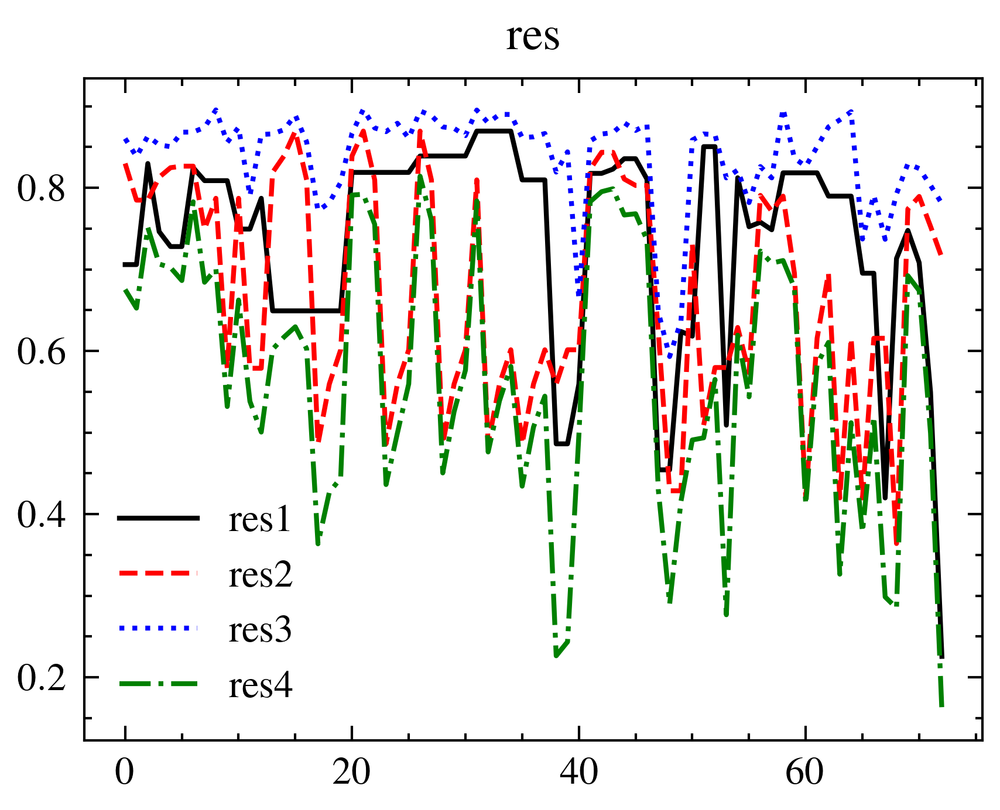

In [14]:
# plt.figure(figsize=(20,5))
plt.plot(res1,label='res1')
plt.plot(res2,label='res2')
plt.plot(res3,label='res3')
plt.plot(res4,label='res4')
plt.title('res')
plt.legend()


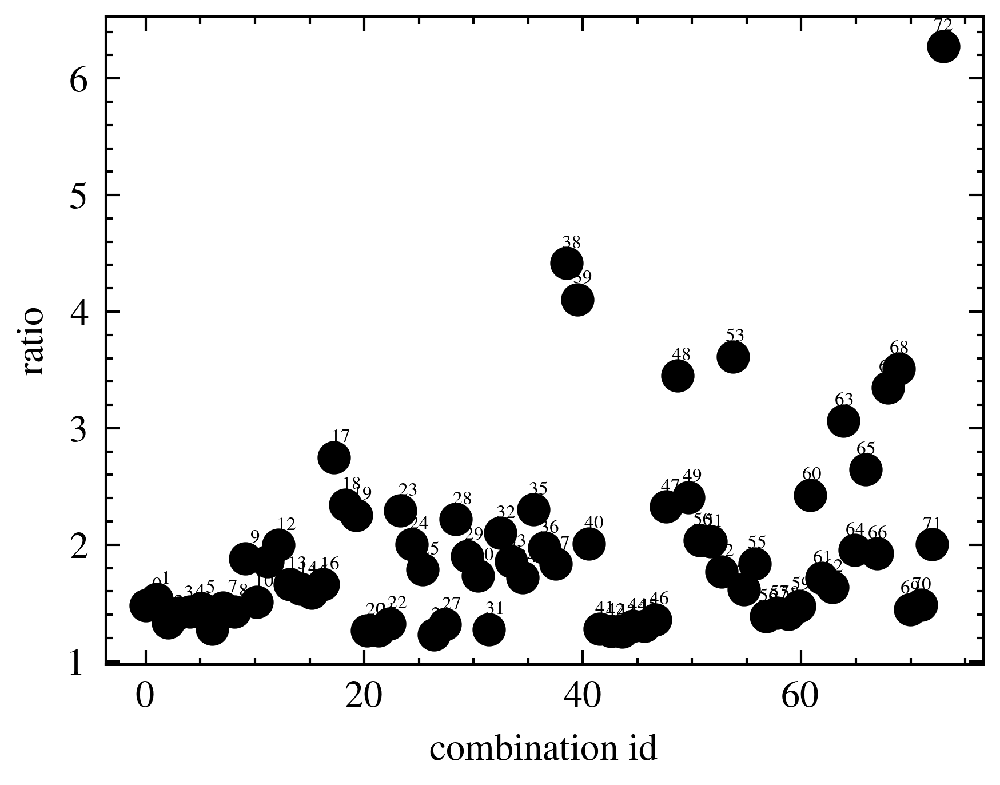

In [42]:
res1 = np.array(res1)
res2 = np.array(res2)
res3 = np.array(res3)
res4 = np.array(res4)

# rates = (res1+res2)/res4
rates = 1/res4

# plt.figure(figsize=(15,10))
x = np.linspace(0,len(rates),len(rates))
# plt.plot(rates,gid=res1)

plt.scatter(x,rates,gid=res1)
# plt.plot(rates,"o-",gid=res1)
plt.xlabel('combination id')
plt.ylabel('ratio')
for a,b in zip(range(0,len(res1)),rates):
    plt.text(a+1,b+0.1,a,ha='center',va='bottom',fontsize=4)
# plt.autoscale(tight=False)
# plt.legend(title='Order')
# plt.savefig('combination_rate.png',dpi=300,pad_inches=0,bbox_inches='tight')
# plt.show()

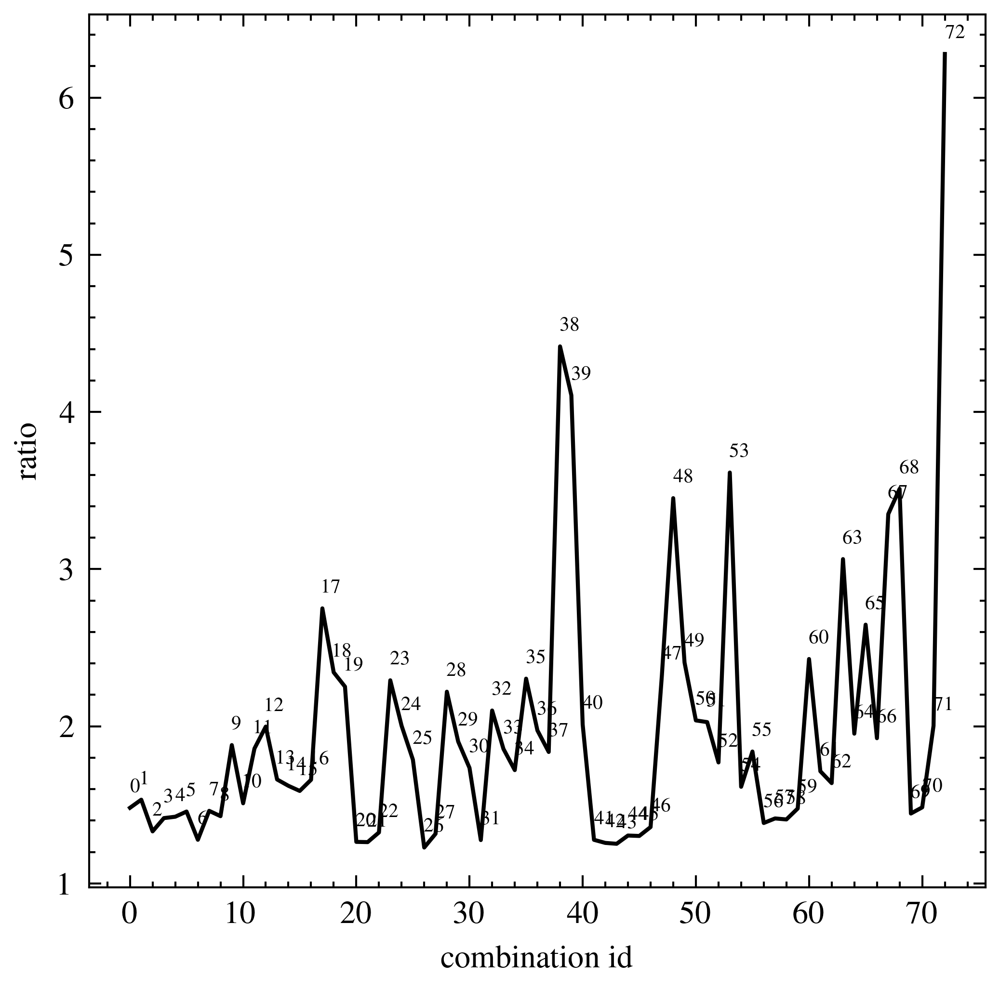

In [58]:
with plt.style.context(['science','ieee']):
    fig,ax = plt.subplots(figsize=(4,4))
    ax.plot(rates)
    for a,b in zip(range(0,len(res1)),rates):
        # ax.text(a,b,a,ha='center',va='bottom',fontsize=4)
        ax.text(a,b+0.1,a,fontsize=5)
    ax.set_ylabel('ratio')
    ax.set_xlabel('combination id')
    fig.savefig('new_pic/2.png',dpi=300)

# # plt.figure(figsize=(15,10))
# x = np.linspace(0,len(rates),len(rates))
# # plt.plot(rates,gid=res1)

# plt.scatter(x,rates,gid=res1)
# # plt.plot(rates,"o-",gid=res1)
# plt.xlabel('combination id')
# plt.ylabel('ratio')
# plt.autoscale(tight=False)
# plt.legend(title='Order')
# plt.savefig('combination_rate.png',dpi=300,pad_inches=0,bbox_inches='tight')
# plt.show()

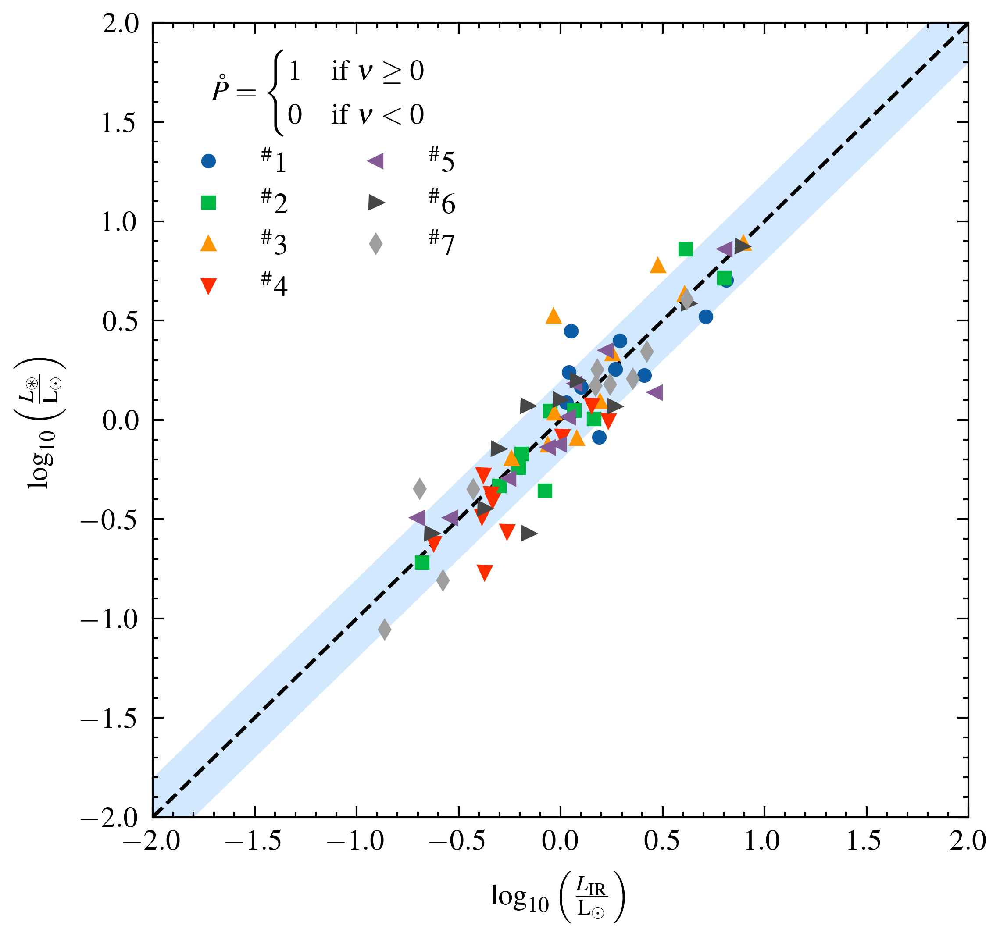

In [44]:
with plt.style.context(['science', 'scatter']):
    fig, ax = plt.subplots(figsize=(4, 4))
    ax.plot([-2, 2], [-2, 2], 'k--')
    ax.fill_between([-2, 2], [-2.2, 1.8], [-1.8, 2.2],
                    color='dodgerblue', alpha=0.2, lw=0)
    for i in range(7):
        x1 = np.random.normal(0, 0.5, 10)
        y1 = x1 + np.random.normal(0, 0.2, 10)
        ax.plot(x1, y1, label=r"$^\#${}".format(i+1))
    lgd = r"$\mathring{P}=\begin{cases}1&\text{if $\nu\geq0$}\\0&\text{if $\nu<0$}\end{cases}$"
    ax.legend(title=lgd, loc=2, ncol=2)
    xlbl = r"$\log_{10}\left(\frac{L_\mathrm{IR}}{\mathrm{L}_\odot}\right)$"
    ylbl = r"$\log_{10}\left(\frac{L_\circledast}{\mathrm{L}_\odot}\right)$"
    ax.set_xlabel(xlbl)
    ax.set_ylabel(ylbl)
    ax.set_xlim([-2, 2])
    ax.set_ylim([-2, 2])
    # fig.savefig('figures/fig3.pdf')
    # fig.savefig('figures/fig3.jpg', dpi=300)

In [71]:
comb[72]

(85, 89)

In [134]:
comb

[(3, 23),
 (3, 42),
 (23, 42),
 (5, 17),
 (21, 26),
 (21, 41),
 (26, 41),
 (14, 30),
 (14, 39),
 (14, 56),
 (30, 39),
 (30, 56),
 (39, 56),
 (9, 15),
 (9, 18),
 (9, 24),
 (9, 37),
 (9, 44),
 (9, 105),
 (9, 121),
 (15, 18),
 (15, 24),
 (15, 37),
 (15, 44),
 (15, 105),
 (15, 121),
 (18, 24),
 (18, 37),
 (18, 44),
 (18, 105),
 (18, 121),
 (24, 37),
 (24, 44),
 (24, 105),
 (24, 121),
 (37, 44),
 (37, 105),
 (37, 121),
 (44, 105),
 (44, 121),
 (105, 121),
 (12, 45),
 (12, 46),
 (45, 46),
 (8, 25),
 (8, 36),
 (25, 36),
 (64, 75),
 (64, 99),
 (75, 99),
 (13, 40),
 (34, 43),
 (34, 106),
 (43, 106),
 (70, 122),
 (49, 68),
 (66, 72),
 (54, 73),
 (32, 35),
 (32, 50),
 (32, 94),
 (32, 107),
 (35, 50),
 (35, 94),
 (35, 107),
 (50, 94),
 (50, 107),
 (94, 107),
 (79, 95),
 (92, 97),
 (33, 53),
 (10, 19),
 (85, 89)]

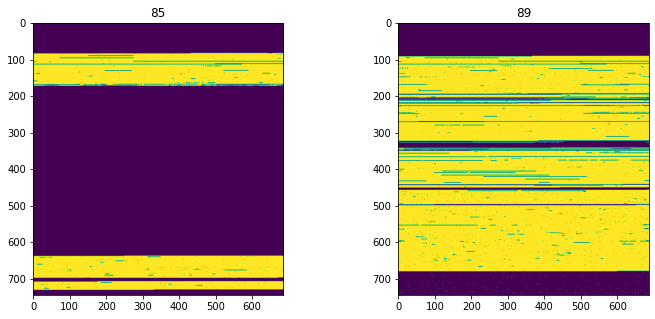

In [119]:
def display_ori_pics(id):
    plt.figure(figsize=(12,5))
    plt.subplot(121)
    plt.imshow((results_ones.T[comb[id][0]]).reshape(745,686))
    plt.title(comb[id][0])
    plt.subplot(122)
    plt.imshow((results_ones.T[comb[id][1]]).reshape(745,686))
    plt.title(comb[id][1])
    plt.savefig('sa_0120/sa_0120_{}.png'.format(id),dpi=300,pad_inches=0,bbox_inches='tight')
    # plt.legend()
    # plt.colorbar()
    # plt.show()

display_ori_pics(72)

In [133]:
to_comb_list = [17,38,39,48,53,63,65,67,68,72]

for i in to_comb_list:
    print(i,comb[i])

17 (9, 44)
38 (44, 105)
39 (44, 121)
48 (64, 99)
53 (43, 106)
63 (35, 94)
65 (50, 94)
67 (94, 107)
68 (79, 95)
72 (85, 89)


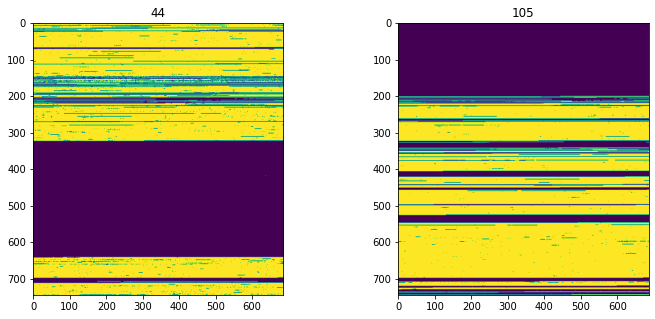

In [103]:
display_ori_pics(comb[38])

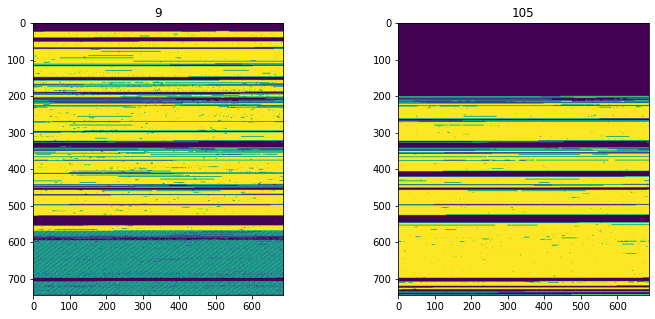

In [104]:
display_ori_pics(comb[18])

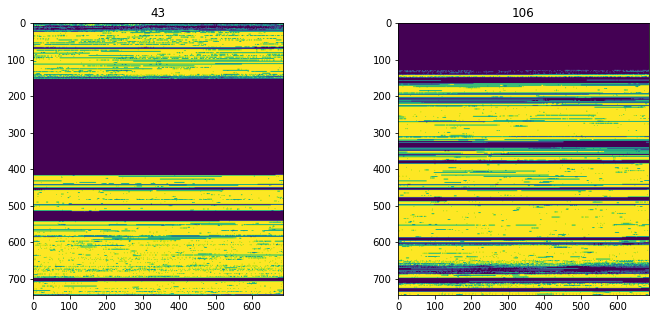

In [108]:
display_ori_pics(comb[53])

/tmp/ipykernel_5881/3594093438.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,5))


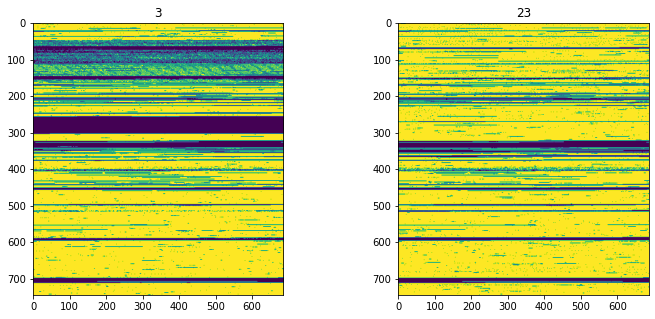

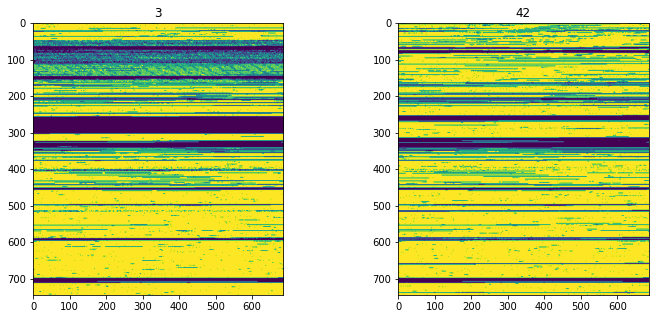

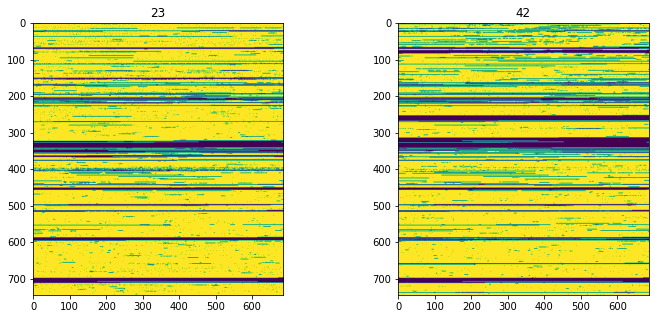

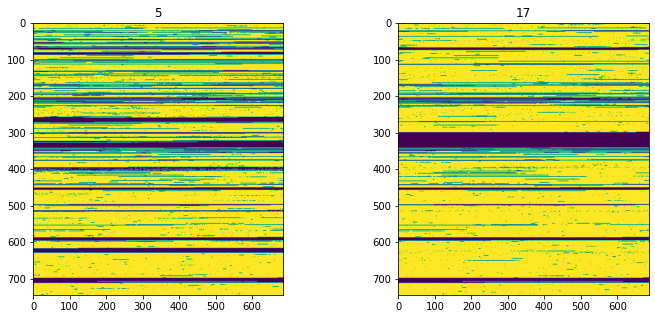

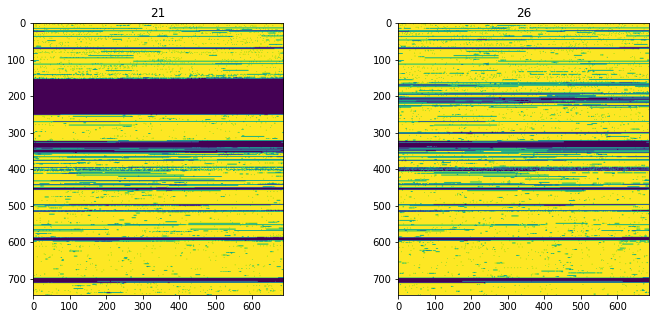

...

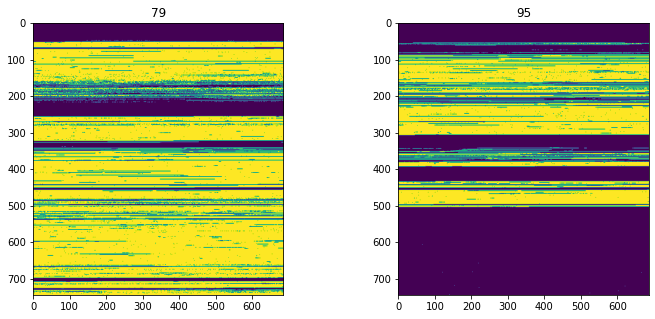

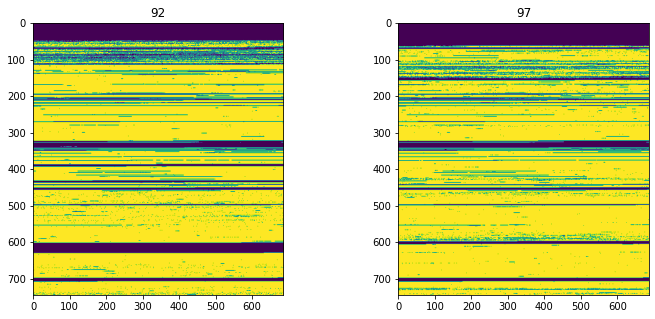

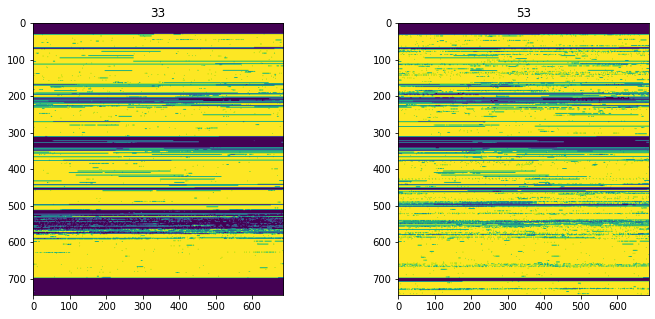

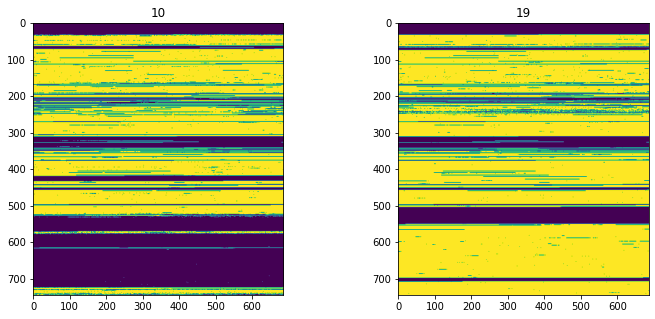

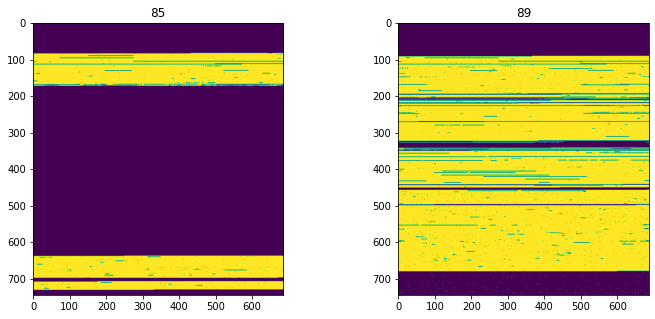

In [120]:
for i in range(0,len(res1)):
    display_ori_pics(i)